In [5]:
import scanpy as sc
import pandas as pd
import numpy as np

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram,linkage
from sklearn.preprocessing import Normalizer

import plotly.express as px

In [2]:
cellclusters = dict(
	gi_epithelial=['0','3','4','6','8','13','19','20','28','31','33','34','35','36','38','39','40'], # 78049 cells, # 32 is heptoid
	squamous_epithelial=['16','18','21'],
	fibroblasts=['7'],
	myofibroblasts=['12'],
	endothelial=['15','5', '30', '26'],
	neuroendocrine=['17'],
	parietal=['29'],
	neutrophils=['22'],
	monocytes_macs_DCs=['10'],  # and macs and dcs
	B_cells=['11','23'],
	cd4_Tcells=['2'],
	cd8_Tcells=['1','25'],
	NK_cells=['14'],
	mast_cells=['9'],
	hepatoid=['27'],
	naive_T_cells=['24'],
	stromal=['7','12','15','5', '30', '26'] # conflicts with endothelial and fibs
)

cells = list(cellclusters.keys())
cells = ['ambient']+cells

inv_cellclusters = {}
for k, v in cellclusters.items():
    for vi in v:
        inv_cellclusters[vi] = k
        
def labelCells(x, inv_cellclusters):
    if str(x) in inv_cellclusters:
        return(inv_cellclusters[str(x)])
    else:
        return('NA')

fc_labels = ['log2FC_NE_NS', 'log2FC_NE_M', 
             'log2FC_NE_D', 'log2FC_NE_T',
             'log2FC_NS_M', 'log2FC_NS_D', 
             'log2FC_NS_T', 'log2FC_M_D', 
             'log2FC_M_T', 'log2FC_D_T']

In [3]:
degs = pd.read_csv('EsoAtlas_DEGs_filtered_by_score_4_11_22.csv', index_col=0)
obs  = pd.read_csv('EsoAtlas_adatas_june2021_final_obs.csv.gz', index_col=0) 
cnts = pd.read_csv('count_means_by_celltype_and_dx_v4.csv.gz', index_col=0)

In [12]:
degs.celltype.value_counts()

gi_epithelial          6841
endothelial            1719
cd8_Tcells              828
neuroendocrine          781
myofibroblasts          722
fibroblasts             651
B_cells                 613
monocytes_macs_DCs      589
cd4_Tcells              170
mast_cells              114
squamous_epithelial      67
NK_cells                 56
naive_T_cells            48
Name: celltype, dtype: int64

In [122]:
CellName = 'gi_epithelial'

For n_clusters = 2 The average silhouette_score is : 0.3334672318573654
For n_clusters = 3 The average silhouette_score is : 0.32055510446930746
For n_clusters = 4 The average silhouette_score is : 0.3027170628669322
For n_clusters = 5 The average silhouette_score is : 0.2760385395231426
For n_clusters = 6 The average silhouette_score is : 0.2811041693151856
For n_clusters = 7 The average silhouette_score is : 0.27231499096022954
For n_clusters = 8 The average silhouette_score is : 0.26156942942101047
For n_clusters = 9 The average silhouette_score is : 0.2654728717478746
For n_clusters = 10 The average silhouette_score is : 0.2521847441364679
For n_clusters = 11 The average silhouette_score is : 0.2560217371944823
For n_clusters = 12 The average silhouette_score is : 0.2432538996171547
For n_clusters = 13 The average silhouette_score is : 0.24052864583894357


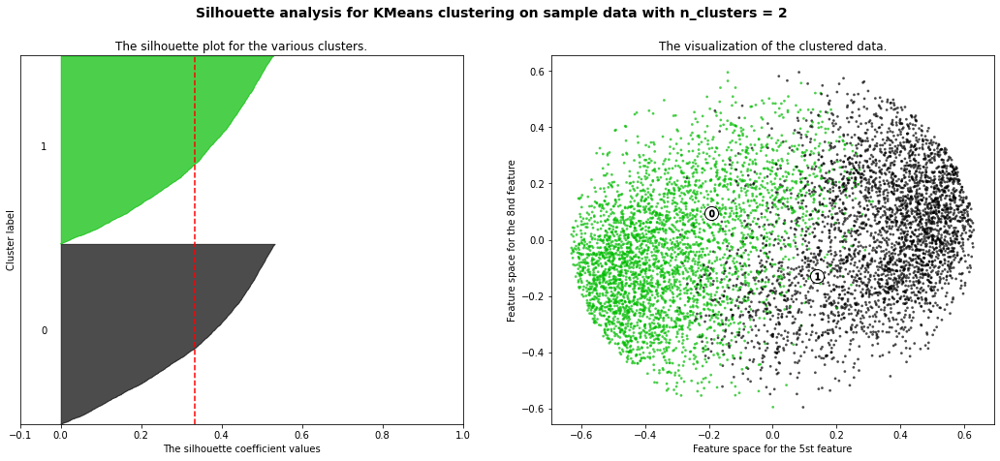

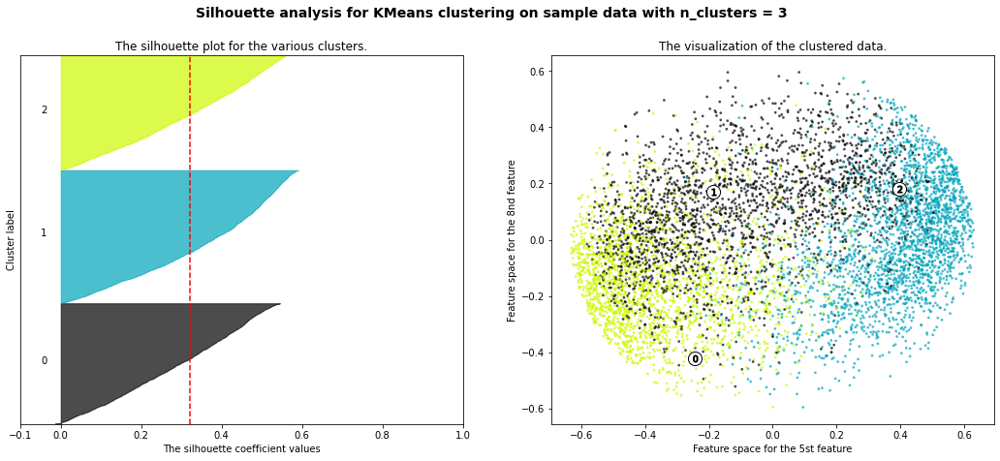

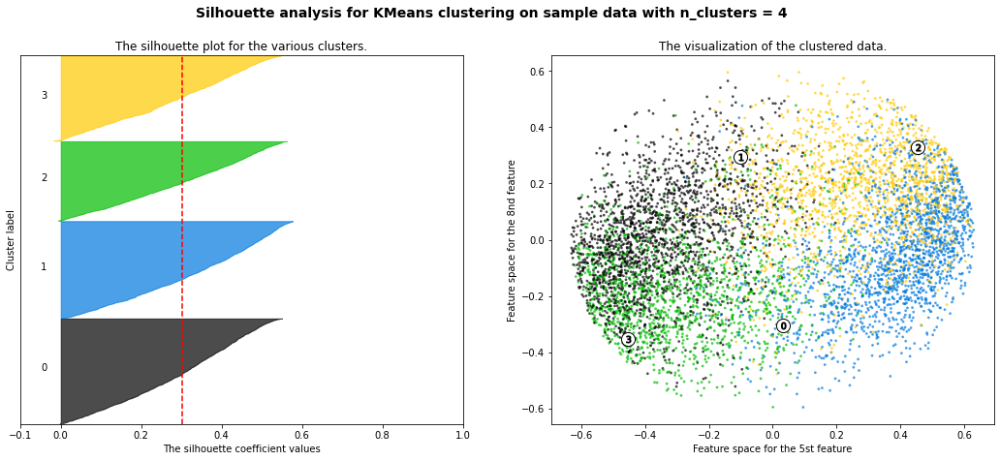

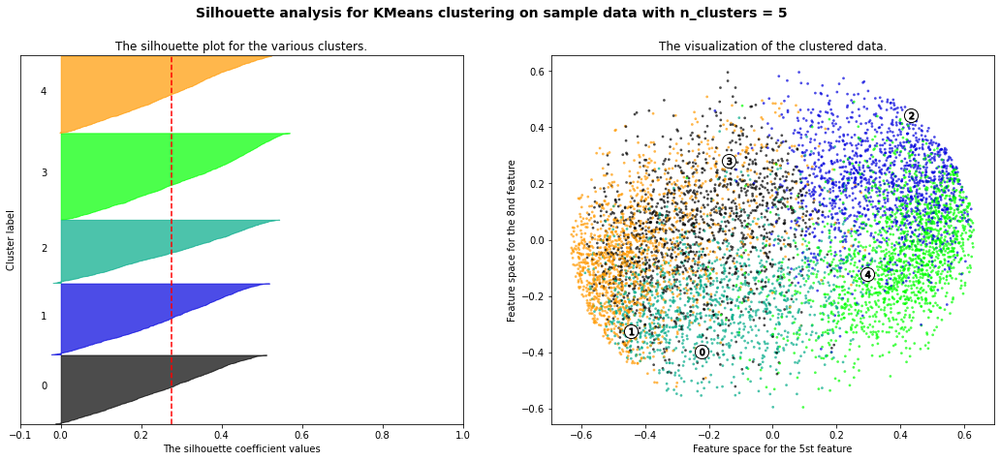

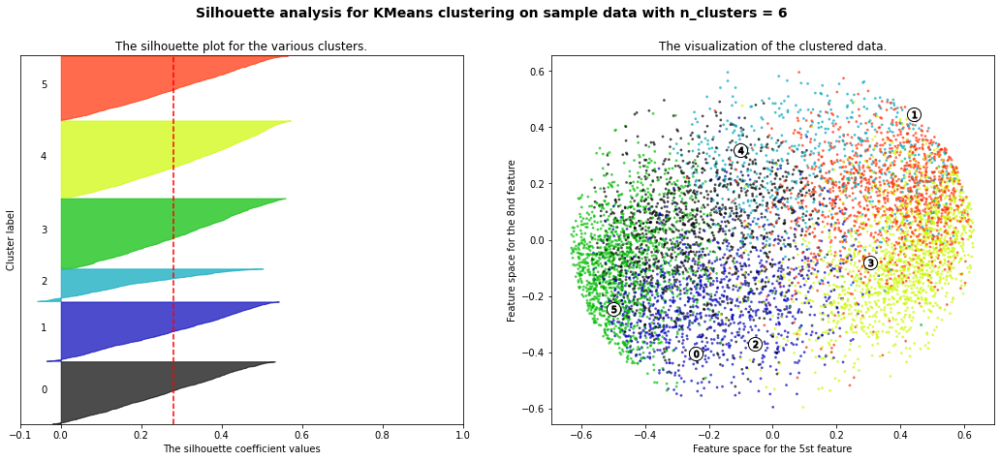

...

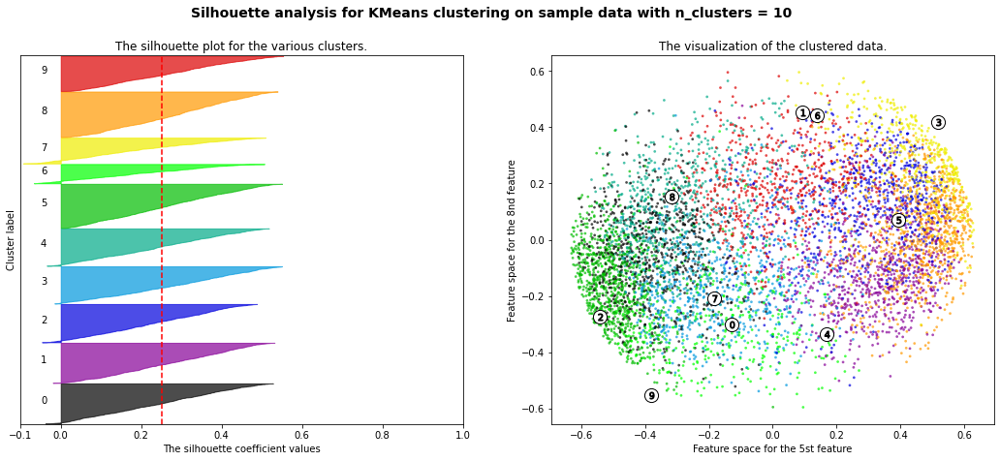

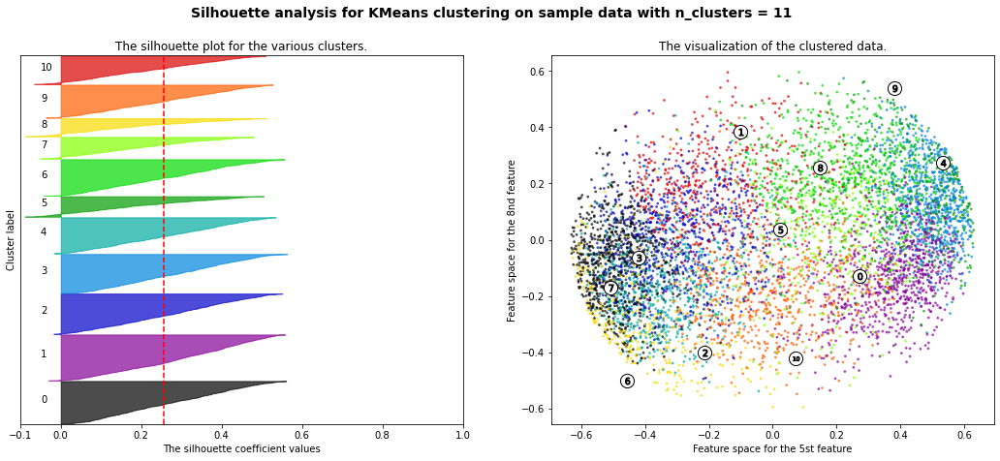

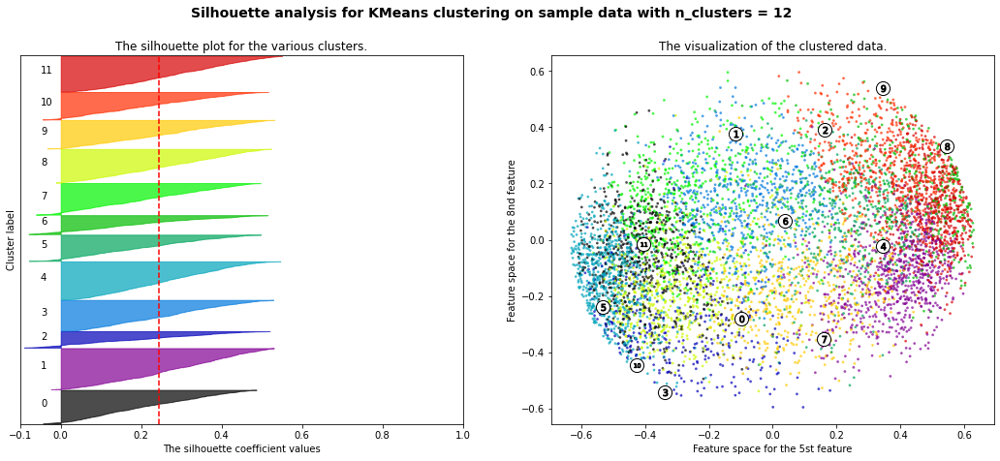

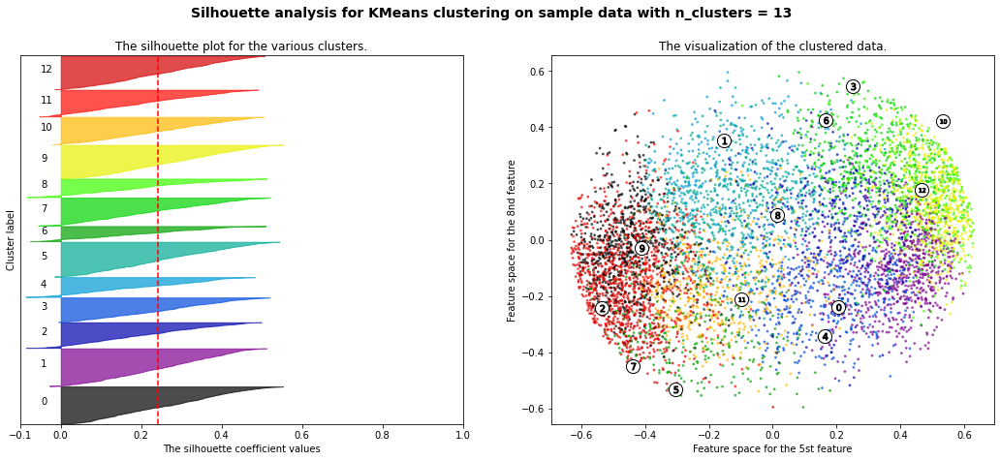

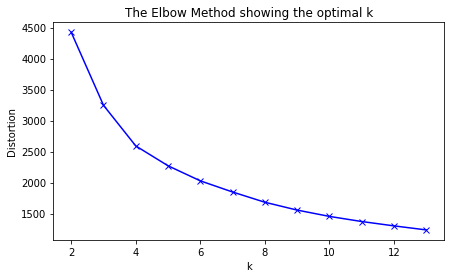

In [123]:
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# get degs
cell_degs = degs.loc[degs.celltype == CellName]

# then the FC table
cells_fc = cell_degs.loc[:, fc_labels]

# to get the genes
cell_genes = cell_degs.gene[cells_fc.index.to_list()].values

cells_fc.index = cell_genes

X = Normalizer().fit_transform(cells_fc)

distortions = []

range_n_clusters = [2, 3, 4, 5, 6, 7, 8,9,10,11,12,13]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
    distortions.append(clusterer.inertia_)
    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 6], X[:, 7], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 5st feature")
    ax2.set_ylabel("Feature space for the 8nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

plt.figure(figsize=(7,4))
plt.plot(range_n_clusters, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

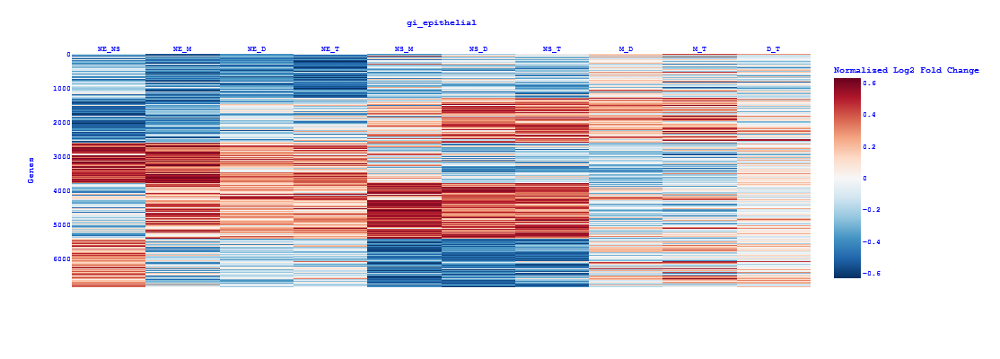

   GeneCnt  Cumula
0     1284    1284
1     1330    2614
2     1183    3797
3     1613    5410
4     1431    6841


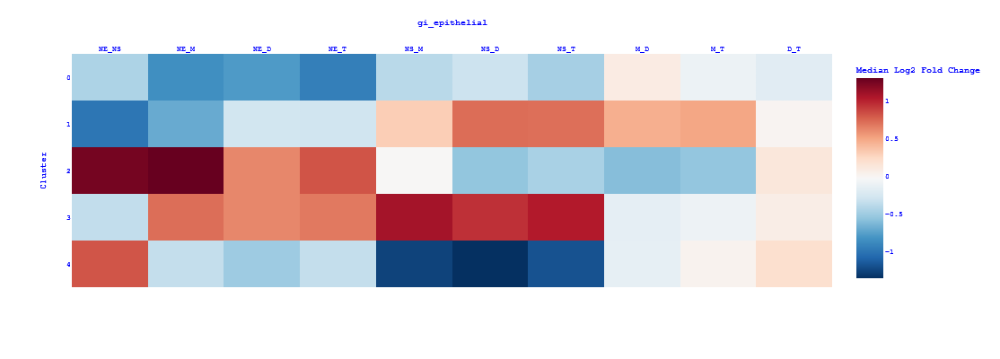

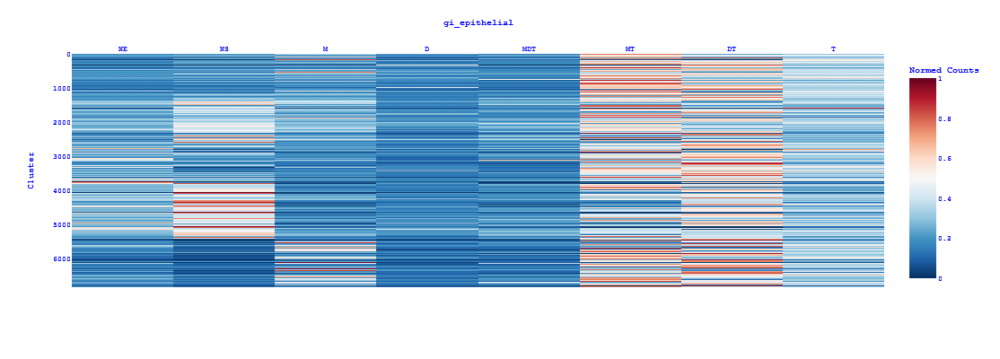

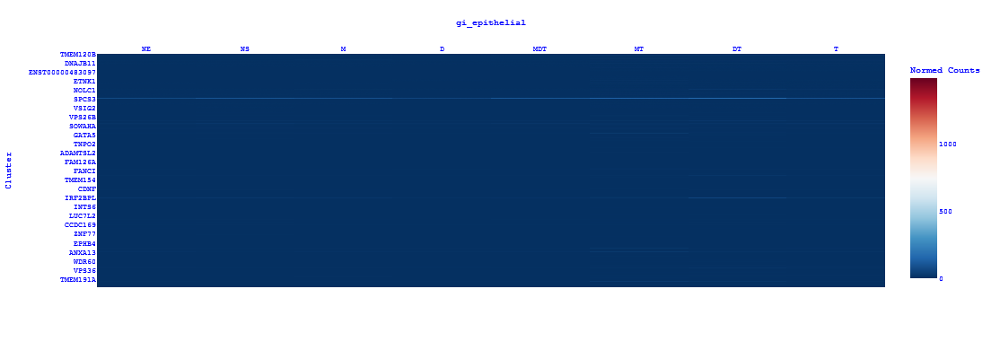

In [125]:

n_clusters = 5

# get degs
cell_degs = degs.loc[degs.celltype == CellName]


# then the FC table
cells_fc = cell_degs.loc[:, fc_labels]

# to get the genes
cell_genes = cell_degs.gene[cells_fc.index.to_list()].values

# and name the index
cells_fc.index = cell_genes

# norm each row.
data_normed = Normalizer().fit_transform(cells_fc)

# get cnts 
cell_cnts = cnts.loc[cnts.Cell == CellName]
cell_cnts.index = cell_cnts.Gene.values

cell_cnts = cell_cnts.drop(['Cell','Gene'], axis=1)
cell_cnts = cell_cnts.loc[cell_genes, :]


##################################

clusterer = KMeans(n_clusters=n_clusters, random_state=10)
cluster_labels = clusterer.fit_predict(data_normed)

##################################

data_for_plot = data_normed[ np.argsort(cluster_labels)]


fig = px.imshow(data_for_plot,
                labels=dict(x=CellName, y="Genes", color="Normalized Log2 Fold Change"),
                x=['NE_NS',	'NE_M',	'NE_D',	'NE_T',	'NS_M',	'NS_D',	'NS_T',	'M_D', 'M_T', 'D_T'],
                #y=B_cells_cnts_genes,
                color_continuous_scale='RdBu_r', 
                #origin='lower',
                aspect="auto",
                width=600,
                height=400
               )
fig.update_layout(
    font_size=8,
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig.update_xaxes(side="top")
fig.show()

##################################

cluster_count = (np.bincount(cluster_labels))
cluster_cumsum = cluster_count.cumsum()

cdfcnt = pd.DataFrame({
                      'GeneCnt':cluster_count,
                      'Cumula':cluster_cumsum})

print(cdfcnt)


#############################

data_for_plot_mean = cells_fc.groupby( cluster_labels ).median()

fig2 = px.imshow(data_for_plot_mean,
                labels=dict(x=CellName, y="Cluster", color="Median Log2 Fold Change"),
                x=['NE_NS',	'NE_M',	'NE_D',	'NE_T',	'NS_M',	'NS_D',	'NS_T',	'M_D', 'M_T', 'D_T'],
                #y=B_cells_cnts_genes,
                color_continuous_scale='RdBu_r', 
                #origin='lower',
                aspect="auto",
                width=600,
                height=400
               )
fig2.update_layout(
    font_size=8,
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig2.update_xaxes(side="top")
fig2.show()

#################################

# get the count data sorted by cluster label
data_for_cnt_plot = cell_cnts.iloc[ np.argsort(cluster_labels),: ]

# norm each row.
cnts_normed = pd.DataFrame(Normalizer().fit_transform(data_for_cnt_plot))

# avergge by cluster
cnts_normed_mean = cnts_normed.groupby( cluster_labels ).median()


fig3 = px.imshow(cnts_normed,
                labels=dict(x=CellName, y="Cluster", color="Normed Counts"),
                x=['NE',	'NS',	'M',	'D',	'MDT',	'MT',	'DT',	'T'],
                #y=B_cells_cnts_genes,
                color_continuous_scale='RdBu_r', 
                #origin='lower',
                aspect="auto",
                width=600,
                height=400
               )

fig3.update_layout(
    font_size=8,
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig3.update_xaxes(side="top")
fig3.show()

######################################

#################################

# get the count data sorted by cluster label
data_for_cnt_plot = cell_cnts.iloc[ np.argsort(cluster_labels),: ]


fig4 = px.imshow(data_for_cnt_plot,
                labels=dict(x=CellName, y="Cluster", color="Normed Counts"),
                x=['NE',	'NS',	'M',	'D',	'MDT',	'MT',	'DT',	'T'],
                #y=B_cells_cnts_genes,
                color_continuous_scale='RdBu_r', 
                #origin='lower',
                aspect="auto",
                width=600,
                height=400
               )

fig4.update_layout(
    font_size=8,
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig4.update_xaxes(side="top")
fig4.show()

######################################



df = pd.DataFrame({
    'Cell':[CellName for xi in cell_genes],
    'Gene':cell_genes,
    'Cluster':cluster_labels
})
df.to_csv('DEGs_Cluster_'+CellName+'.csv')